<a href="https://colab.research.google.com/github/hugozub/MIAD/blob/main/Practica_20_1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Práctica #20: Ejercicios con EDA 1
Descripción del conjunto de datos:


Utiliza el conjunto de datos "Air Quality" disponible al final de esta practica. Este conjunto contiene datos horarios de sensores de calidad del aire, incluyendo niveles de CO, NOx, y otros contaminantes. El conjunto de datos tiene valores faltantes y columnas categóricas (por ejemplo, el día de la semana).

**Instrucciones para los estudiantes:**

Descargar el archivo AirQuality.csv desde el enlace proporcionado.

In [16]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import math
import scipy.stats as stats


In [33]:
df = pd.read_csv('/content/drive/MyDrive/MIAD/Programación para analítica descriptiva y predictiva/Practica 20/AirQuality.csv', sep=';')
df = df.drop(columns=['Unnamed: 15','Unnamed: 16'])
print(df.head())


         Date      Time CO(GT)  PT08.S1(CO)  NMHC(GT) C6H6(GT)  PT08.S2(NMHC)  \
0  10/03/2004  18.00.00    2,6       1360.0     150.0     11,9         1046.0   
1  10/03/2004  19.00.00      2       1292.0     112.0      9,4          955.0   
2  10/03/2004  20.00.00    2,2       1402.0      88.0      9,0          939.0   
3  10/03/2004  21.00.00    2,2       1376.0      80.0      9,2          948.0   
4  10/03/2004  22.00.00    1,6       1272.0      51.0      6,5          836.0   

   NOx(GT)  PT08.S3(NOx)  NO2(GT)  PT08.S4(NO2)  PT08.S5(O3)     T    RH  \
0    166.0        1056.0    113.0        1692.0       1268.0  13,6  48,9   
1    103.0        1174.0     92.0        1559.0        972.0  13,3  47,7   
2    131.0        1140.0    114.0        1555.0       1074.0  11,9  54,0   
3    172.0        1092.0    122.0        1584.0       1203.0  11,0  60,0   
4    131.0        1205.0    116.0        1490.0       1110.0  11,2  59,6   

       AH  
0  0,7578  
1  0,7255  
2  0,7502  
3  0,786

In [34]:
df['datetime'] = df['Date'] + ' ' + df['Time']
df['datetime'] = pd.to_datetime(df['datetime'], format='%d/%m/%Y %H.%M.%S')
df = df.drop(columns=['Date', 'Time'])
print(df.head())

  CO(GT)  PT08.S1(CO)  NMHC(GT) C6H6(GT)  PT08.S2(NMHC)  NOx(GT)  \
0    2,6       1360.0     150.0     11,9         1046.0    166.0   
1      2       1292.0     112.0      9,4          955.0    103.0   
2    2,2       1402.0      88.0      9,0          939.0    131.0   
3    2,2       1376.0      80.0      9,2          948.0    172.0   
4    1,6       1272.0      51.0      6,5          836.0    131.0   

   PT08.S3(NOx)  NO2(GT)  PT08.S4(NO2)  PT08.S5(O3)     T    RH      AH  \
0        1056.0    113.0        1692.0       1268.0  13,6  48,9  0,7578   
1        1174.0     92.0        1559.0        972.0  13,3  47,7  0,7255   
2        1140.0    114.0        1555.0       1074.0  11,9  54,0  0,7502   
3        1092.0    122.0        1584.0       1203.0  11,0  60,0  0,7867   
4        1205.0    116.0        1490.0       1110.0  11,2  59,6  0,7888   

             datetime  
0 2004-03-10 18:00:00  
1 2004-03-10 19:00:00  
2 2004-03-10 20:00:00  
3 2004-03-10 21:00:00  
4 2004-03-10 22:00:0

In [35]:
df['CO(GT)'] = df['CO(GT)'].str.replace(',', '.').astype(float)
df['C6H6(GT)'] = df['C6H6(GT)'].str.replace(',', '.').astype(float)
df['T'] = df['T'].str.replace(',', '.').astype(float)
df['RH'] = df['RH'].str.replace(',', '.').astype(float)
df['AH'] = df['AH'].str.replace(',', '.').astype(float)

In [36]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9471 entries, 0 to 9470
Data columns (total 14 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   CO(GT)         9357 non-null   float64       
 1   PT08.S1(CO)    9357 non-null   float64       
 2   NMHC(GT)       9357 non-null   float64       
 3   C6H6(GT)       9357 non-null   float64       
 4   PT08.S2(NMHC)  9357 non-null   float64       
 5   NOx(GT)        9357 non-null   float64       
 6   PT08.S3(NOx)   9357 non-null   float64       
 7   NO2(GT)        9357 non-null   float64       
 8   PT08.S4(NO2)   9357 non-null   float64       
 9   PT08.S5(O3)    9357 non-null   float64       
 10  T              9357 non-null   float64       
 11  RH             9357 non-null   float64       
 12  AH             9357 non-null   float64       
 13  datetime       9357 non-null   datetime64[ns]
dtypes: datetime64[ns](1), float64(13)
memory usage: 1.0 MB


2. Descargar el archivo AirQuality.csv desde el enlace proporcionado.

*  Realizar un EDA completo, incluyendo:  Descripción de los datos (medias, medianas, desviaciones estándar, etc.).

* Histogramas para las columnas numéricas.

* De la columna Time obten el día de la Semana y realiza una gráfica de barras.

* Boxplots para identificar outliers en las columnas numéricas.

* Matriz de correlación y mapa de calor.

* Pairplot para visualizar relaciones entre variables numéricas.

* Pruebas de normalidad (Shapiro-Wilk, Anderson-Darling, Kolmogorov-Smirnov) y QQplot para las columnas numéricas.

In [37]:
print(df.describe())

            CO(GT)  PT08.S1(CO)     NMHC(GT)     C6H6(GT)  PT08.S2(NMHC)  \
count  9357.000000  9357.000000  9357.000000  9357.000000    9357.000000   
mean    -34.207524  1048.990061  -159.090093     1.865683     894.595276   
min    -200.000000  -200.000000  -200.000000  -200.000000    -200.000000   
25%       0.600000   921.000000  -200.000000     4.000000     711.000000   
50%       1.500000  1053.000000  -200.000000     7.900000     895.000000   
75%       2.600000  1221.000000  -200.000000    13.600000    1105.000000   
max      11.900000  2040.000000  1189.000000    63.700000    2214.000000   
std      77.657170   329.832710   139.789093    41.380206     342.333252   

           NOx(GT)  PT08.S3(NOx)      NO2(GT)  PT08.S4(NO2)  PT08.S5(O3)  \
count  9357.000000   9357.000000  9357.000000   9357.000000  9357.000000   
mean    168.616971    794.990168    58.148873   1391.479641   975.072032   
min    -200.000000   -200.000000  -200.000000   -200.000000  -200.000000   
25%      50

# Hisrogramas de columnas númericas

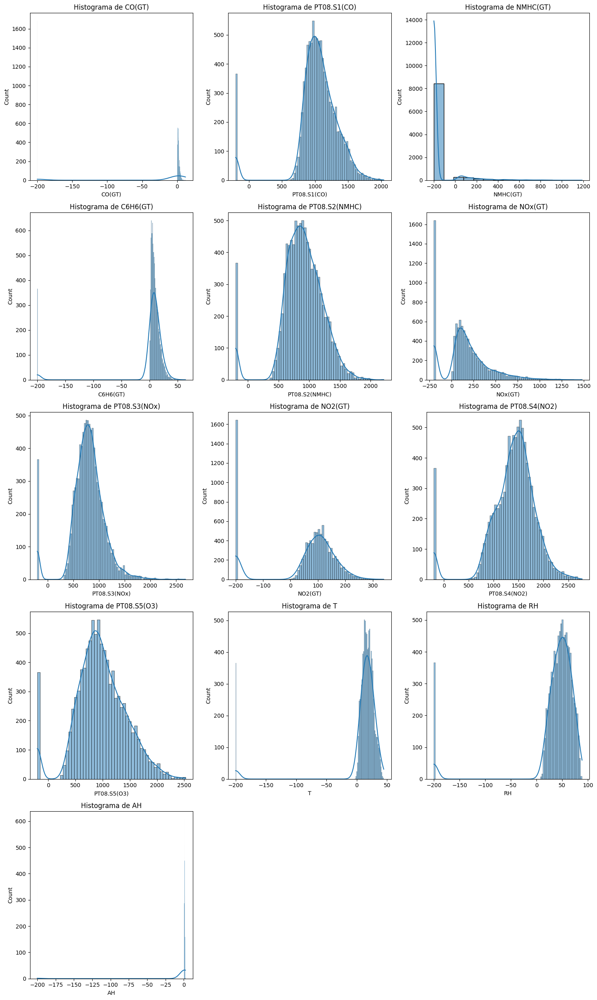

In [38]:
df_num = df.select_dtypes(include=[np.number])
ncols = 3
nrows = math.ceil(len(df_num.columns) / ncols)

fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(15, 5 * nrows))
axes = axes.flatten()

for i, column in enumerate(df_num.columns):
    sns.histplot(df_num[column], kde=True, ax=axes[i])
    axes[i].set_title(f'Histograma de {column}')


for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

In [39]:
df['weekday'] = df['datetime'].dt.dayofweek
df["weekday_name"] = df["weekday"].replace({
    0: "Monday",
    1: "Tuesday",
    2: "Wednesday",
    3: "Thursday",
    4: "Friday",
    5: "Saturday",
    6: "Sunday"
})
print(df["weekday_name"].value_counts())

weekday_name
Thursday     1344
Friday       1344
Saturday     1344
Sunday       1344
Monday       1335
Wednesday    1326
Tuesday      1320
Name: count, dtype: int64


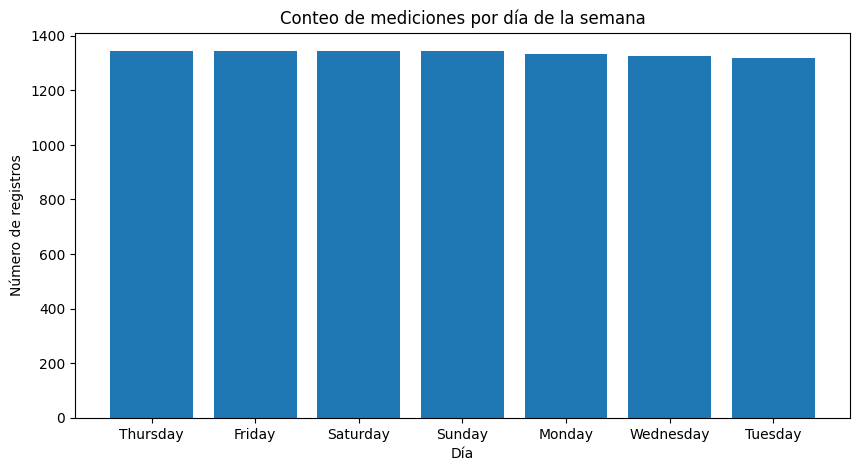

In [40]:
counts = df['weekday_name'].value_counts()

plt.figure(figsize=(10,5))
plt.bar(counts.index, counts.values)
plt.title('Conteo de mediciones por día de la semana')
plt.xlabel('Día')
plt.ylabel('Número de registros')
plt.show()


# Boxplots

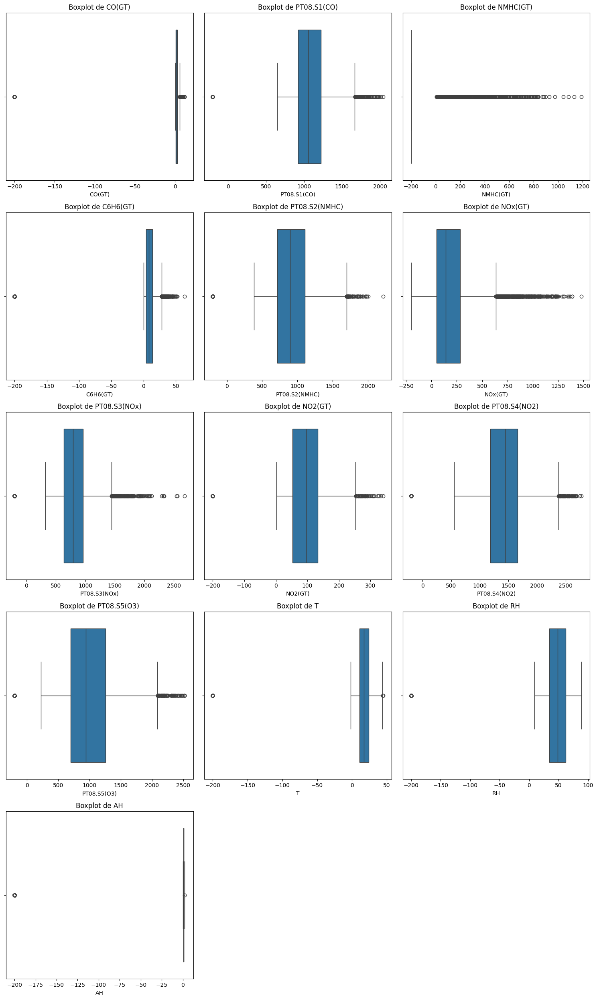

In [41]:
df_num = df.drop(columns=['weekday','weekday_name','datetime'])
ncols = 3
nrows = math.ceil(len(df_num.columns) / ncols)

fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(15, 5 * nrows))
axes = axes.flatten()

for i, column in enumerate(df_num.columns):
    sns.boxplot(x=df_num[column], ax=axes[i])
    axes[i].set_title(f'Boxplot de {column}')


for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()

# Matriz de correlación y mapa de calor


Matriz de correlación:
                 CO(GT)  PT08.S1(CO)  NMHC(GT)  C6H6(GT)  PT08.S2(NMHC)  \
CO(GT)         1.000000     0.041411  0.128351 -0.031378       0.029926   
PT08.S1(CO)    0.041411     1.000000  0.170007  0.852687       0.933102   
NMHC(GT)       0.128351     0.170007  1.000000  0.037323       0.110104   
C6H6(GT)      -0.031378     0.852687  0.037323  1.000000       0.767433   
PT08.S2(NMHC)  0.029926     0.933102  0.110104  0.767433       1.000000   
NOx(GT)        0.526451     0.277993 -0.004427 -0.001174       0.331272   
PT08.S3(NOx)  -0.089981     0.087019  0.048821  0.512193      -0.073667   
NO2(GT)        0.671127     0.154030  0.103307 -0.010992       0.176488   
PT08.S4(NO2)  -0.073724     0.845149  0.162680  0.774673       0.874782   
PT08.S5(O3)    0.080310     0.892434  0.101185  0.641334       0.909905   
T             -0.068939     0.754844 -0.000009  0.971375       0.669025   
RH            -0.048227     0.745375  0.008284  0.925062       0.585803   
AH

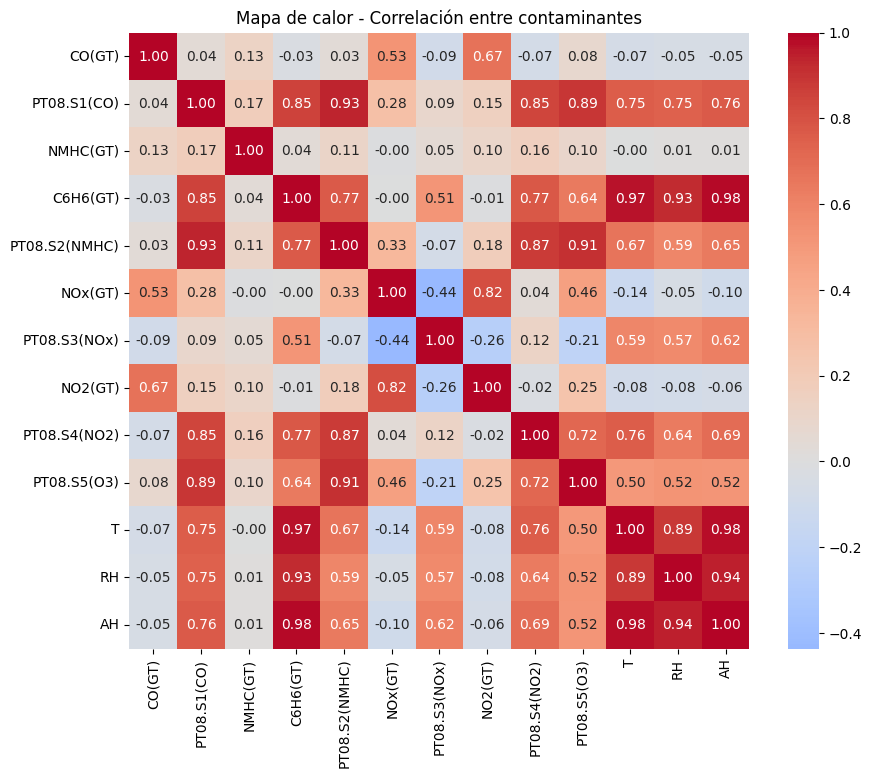

In [42]:
corr = df_num.corr(method='pearson')
print("Matriz de correlación:")
print(corr)

plt.figure(figsize=(10,8))
sns.heatmap(corr, annot=True, cmap="coolwarm", center=0, fmt=".2f")
plt.title("Mapa de calor - Correlación entre contaminantes")
plt.show()

# Pairplot para visualizar relaciones entre variables numéricas.

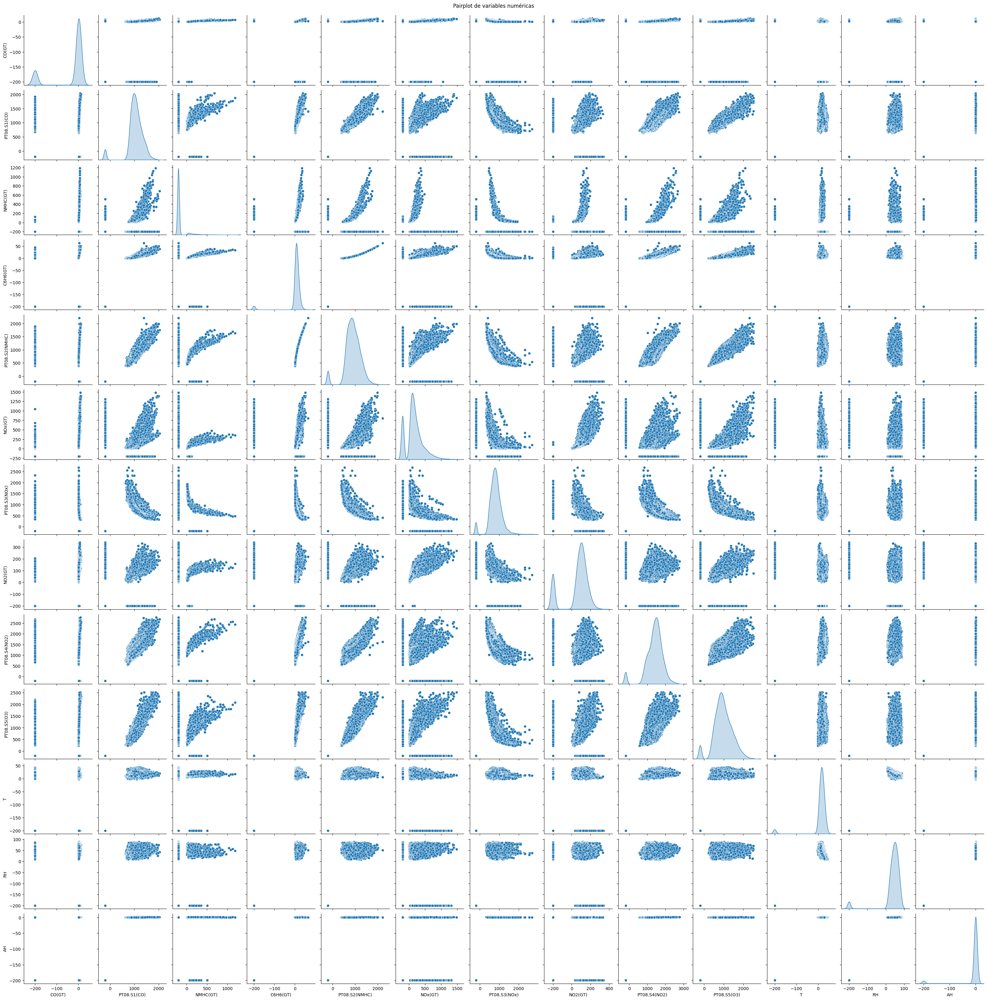

In [43]:
sns.pairplot(df_num, diag_kind="kde")
plt.suptitle("Pairplot de variables numéricas", y=1)
plt.show()

# Pruebas de normalidad (Shapiro-Wilk, Anderson-Darling, Kolmogorov-Smirnov) y QQplot para las columnas numéricas.

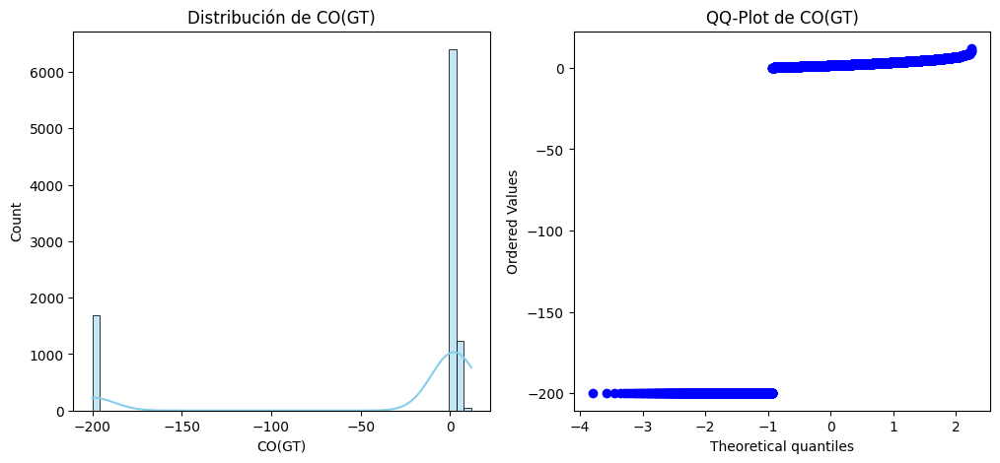


Pruebas de normalidad para la columna: CO(GT)
Shapiro-Wilk Test: p-valor = nan
Kolmogorov-Smirnov Test: p-valor = nan
Anderson-Darling Test: Estadístico = nan
  Al nivel de significancia 15.0%, los datos NO parecen normales.
  Al nivel de significancia 10.0%, los datos NO parecen normales.
  Al nivel de significancia 5.0%, los datos NO parecen normales.
  Al nivel de significancia 2.5%, los datos NO parecen normales.
  Al nivel de significancia 1.0%, los datos NO parecen normales.
D'Agostino-Pearson Test: p-valor = nan


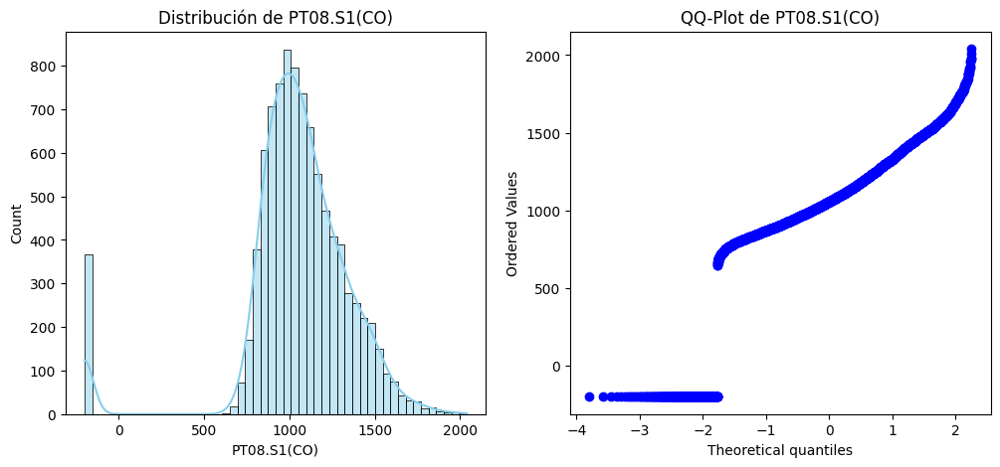


Pruebas de normalidad para la columna: PT08.S1(CO)
Shapiro-Wilk Test: p-valor = nan
Kolmogorov-Smirnov Test: p-valor = nan
Anderson-Darling Test: Estadístico = nan
  Al nivel de significancia 15.0%, los datos NO parecen normales.
  Al nivel de significancia 10.0%, los datos NO parecen normales.
  Al nivel de significancia 5.0%, los datos NO parecen normales.
  Al nivel de significancia 2.5%, los datos NO parecen normales.
  Al nivel de significancia 1.0%, los datos NO parecen normales.
D'Agostino-Pearson Test: p-valor = nan


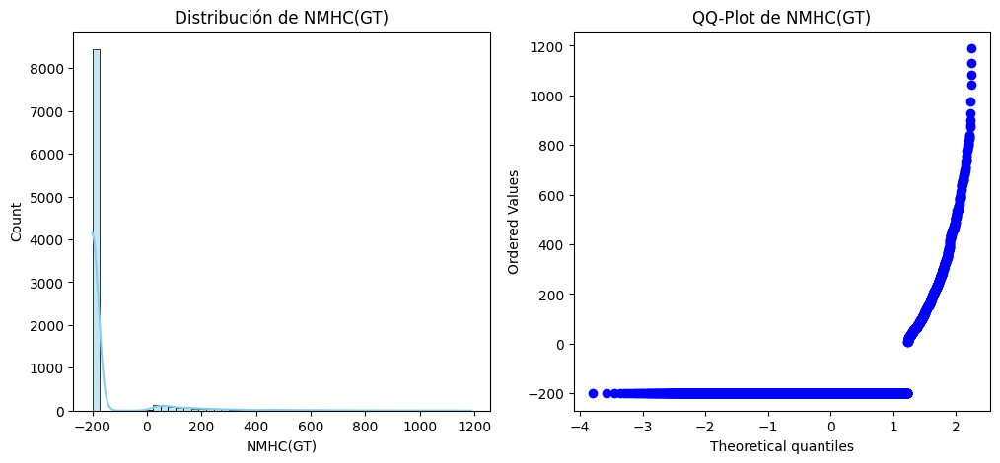


Pruebas de normalidad para la columna: NMHC(GT)
Shapiro-Wilk Test: p-valor = nan
Kolmogorov-Smirnov Test: p-valor = nan
Anderson-Darling Test: Estadístico = nan
  Al nivel de significancia 15.0%, los datos NO parecen normales.
  Al nivel de significancia 10.0%, los datos NO parecen normales.
  Al nivel de significancia 5.0%, los datos NO parecen normales.
  Al nivel de significancia 2.5%, los datos NO parecen normales.
  Al nivel de significancia 1.0%, los datos NO parecen normales.
D'Agostino-Pearson Test: p-valor = nan


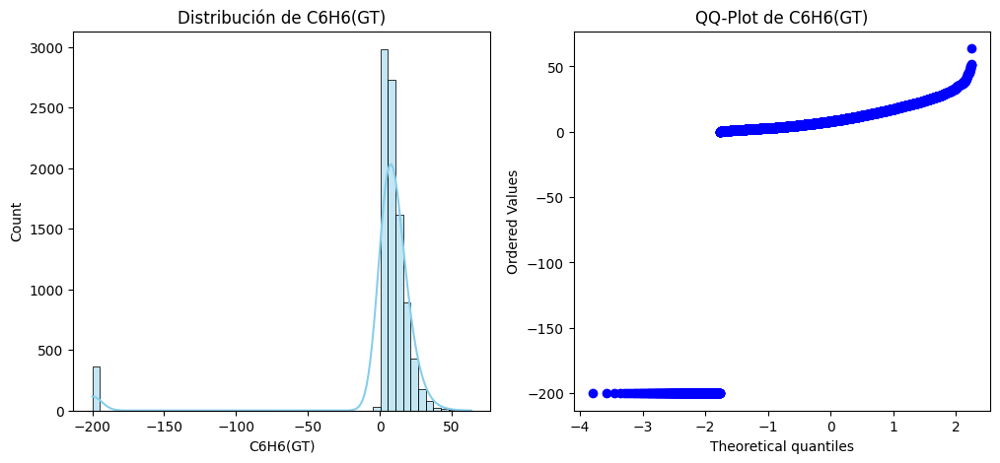


Pruebas de normalidad para la columna: C6H6(GT)
Shapiro-Wilk Test: p-valor = nan
Kolmogorov-Smirnov Test: p-valor = nan
Anderson-Darling Test: Estadístico = nan
  Al nivel de significancia 15.0%, los datos NO parecen normales.
  Al nivel de significancia 10.0%, los datos NO parecen normales.
  Al nivel de significancia 5.0%, los datos NO parecen normales.
  Al nivel de significancia 2.5%, los datos NO parecen normales.
  Al nivel de significancia 1.0%, los datos NO parecen normales.
D'Agostino-Pearson Test: p-valor = nan


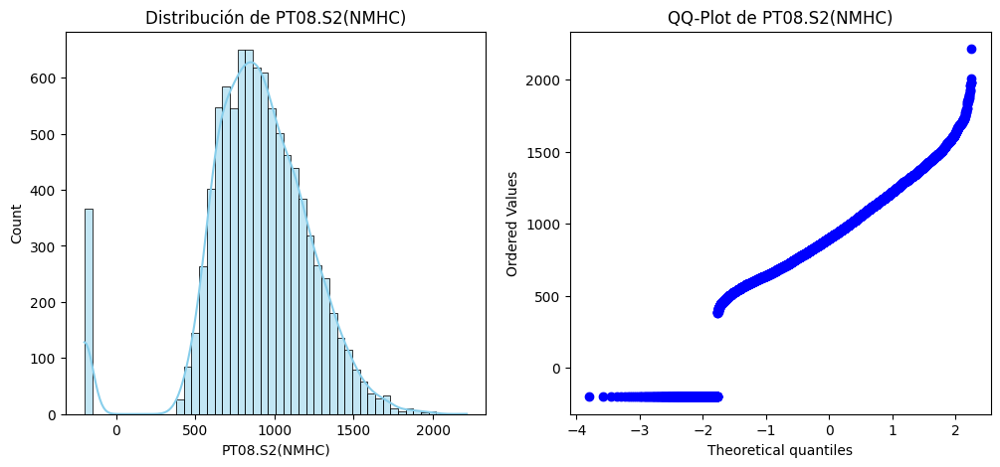


Pruebas de normalidad para la columna: PT08.S2(NMHC)
Shapiro-Wilk Test: p-valor = nan
Kolmogorov-Smirnov Test: p-valor = nan
Anderson-Darling Test: Estadístico = nan
  Al nivel de significancia 15.0%, los datos NO parecen normales.
  Al nivel de significancia 10.0%, los datos NO parecen normales.
  Al nivel de significancia 5.0%, los datos NO parecen normales.
  Al nivel de significancia 2.5%, los datos NO parecen normales.
  Al nivel de significancia 1.0%, los datos NO parecen normales.
D'Agostino-Pearson Test: p-valor = nan


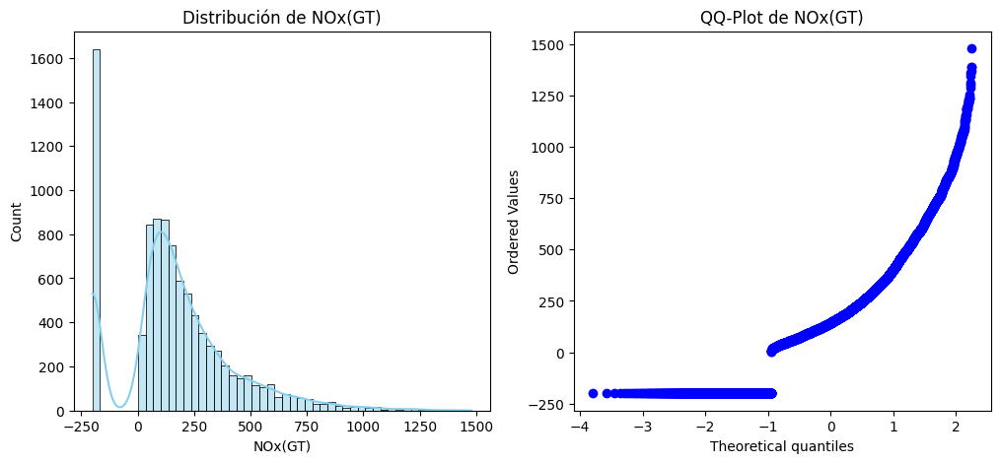


Pruebas de normalidad para la columna: NOx(GT)
Shapiro-Wilk Test: p-valor = nan
Kolmogorov-Smirnov Test: p-valor = nan
Anderson-Darling Test: Estadístico = nan
  Al nivel de significancia 15.0%, los datos NO parecen normales.
  Al nivel de significancia 10.0%, los datos NO parecen normales.
  Al nivel de significancia 5.0%, los datos NO parecen normales.
  Al nivel de significancia 2.5%, los datos NO parecen normales.
  Al nivel de significancia 1.0%, los datos NO parecen normales.
D'Agostino-Pearson Test: p-valor = nan


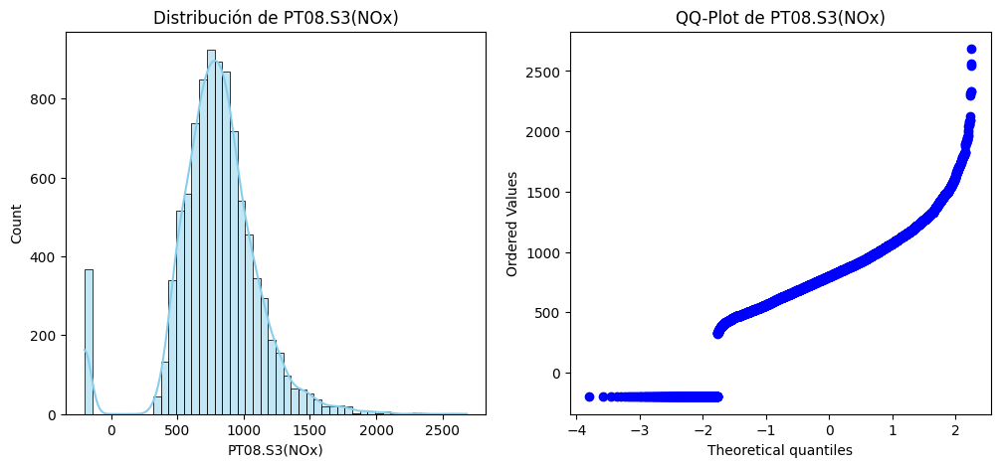


Pruebas de normalidad para la columna: PT08.S3(NOx)
Shapiro-Wilk Test: p-valor = nan
Kolmogorov-Smirnov Test: p-valor = nan
Anderson-Darling Test: Estadístico = nan
  Al nivel de significancia 15.0%, los datos NO parecen normales.
  Al nivel de significancia 10.0%, los datos NO parecen normales.
  Al nivel de significancia 5.0%, los datos NO parecen normales.
  Al nivel de significancia 2.5%, los datos NO parecen normales.
  Al nivel de significancia 1.0%, los datos NO parecen normales.
D'Agostino-Pearson Test: p-valor = nan


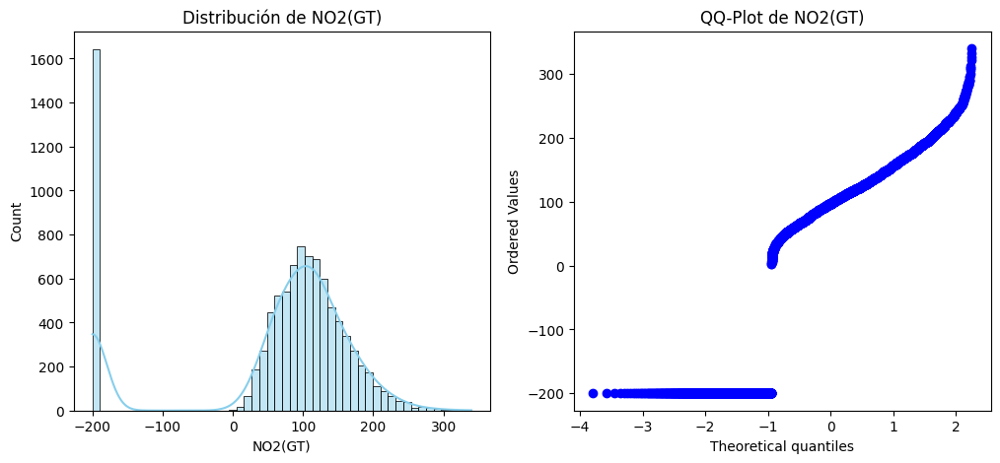


Pruebas de normalidad para la columna: NO2(GT)
Shapiro-Wilk Test: p-valor = nan
Kolmogorov-Smirnov Test: p-valor = nan
Anderson-Darling Test: Estadístico = nan
  Al nivel de significancia 15.0%, los datos NO parecen normales.
  Al nivel de significancia 10.0%, los datos NO parecen normales.
  Al nivel de significancia 5.0%, los datos NO parecen normales.
  Al nivel de significancia 2.5%, los datos NO parecen normales.
  Al nivel de significancia 1.0%, los datos NO parecen normales.
D'Agostino-Pearson Test: p-valor = nan


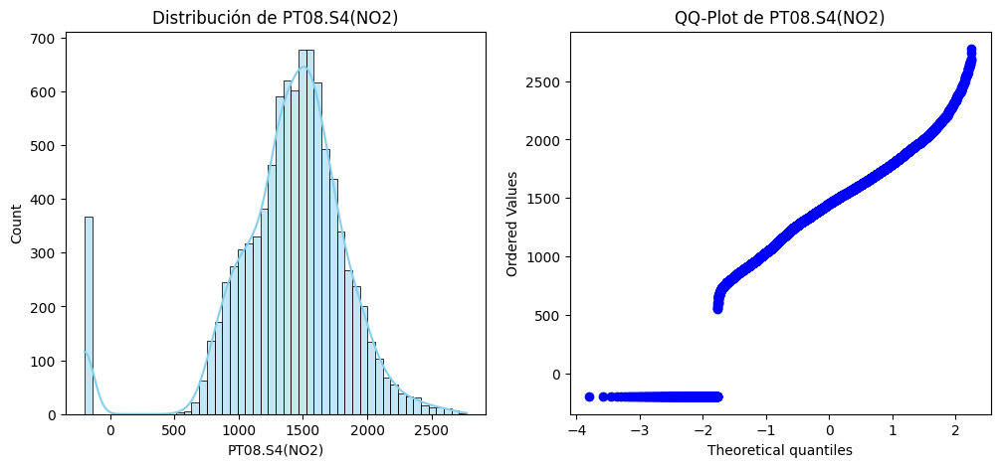


Pruebas de normalidad para la columna: PT08.S4(NO2)
Shapiro-Wilk Test: p-valor = nan
Kolmogorov-Smirnov Test: p-valor = nan
Anderson-Darling Test: Estadístico = nan
  Al nivel de significancia 15.0%, los datos NO parecen normales.
  Al nivel de significancia 10.0%, los datos NO parecen normales.
  Al nivel de significancia 5.0%, los datos NO parecen normales.
  Al nivel de significancia 2.5%, los datos NO parecen normales.
  Al nivel de significancia 1.0%, los datos NO parecen normales.
D'Agostino-Pearson Test: p-valor = nan


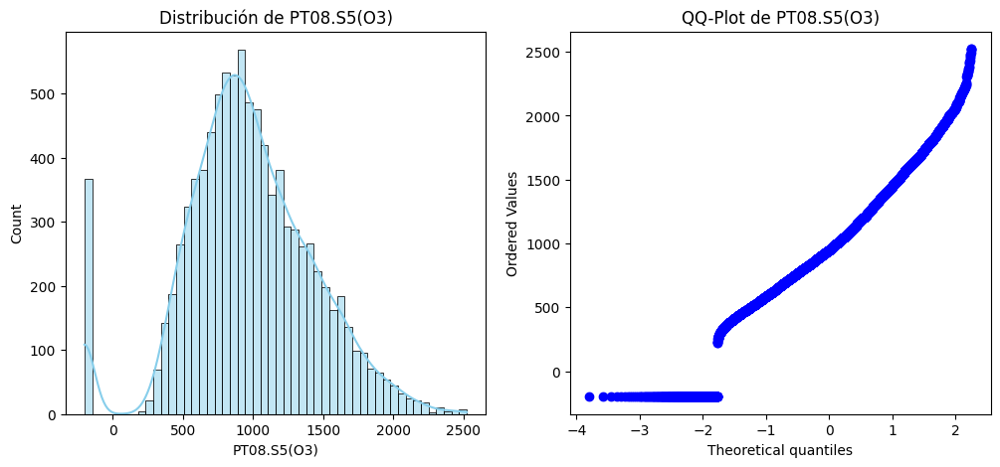


Pruebas de normalidad para la columna: PT08.S5(O3)
Shapiro-Wilk Test: p-valor = nan
Kolmogorov-Smirnov Test: p-valor = nan
Anderson-Darling Test: Estadístico = nan
  Al nivel de significancia 15.0%, los datos NO parecen normales.
  Al nivel de significancia 10.0%, los datos NO parecen normales.
  Al nivel de significancia 5.0%, los datos NO parecen normales.
  Al nivel de significancia 2.5%, los datos NO parecen normales.
  Al nivel de significancia 1.0%, los datos NO parecen normales.
D'Agostino-Pearson Test: p-valor = nan


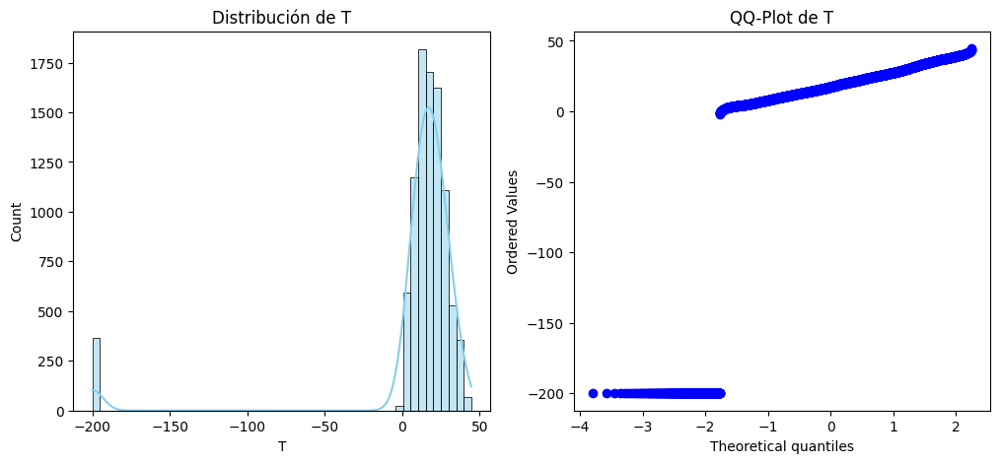


Pruebas de normalidad para la columna: T
Shapiro-Wilk Test: p-valor = nan
Kolmogorov-Smirnov Test: p-valor = nan
Anderson-Darling Test: Estadístico = nan
  Al nivel de significancia 15.0%, los datos NO parecen normales.
  Al nivel de significancia 10.0%, los datos NO parecen normales.
  Al nivel de significancia 5.0%, los datos NO parecen normales.
  Al nivel de significancia 2.5%, los datos NO parecen normales.
  Al nivel de significancia 1.0%, los datos NO parecen normales.
D'Agostino-Pearson Test: p-valor = nan


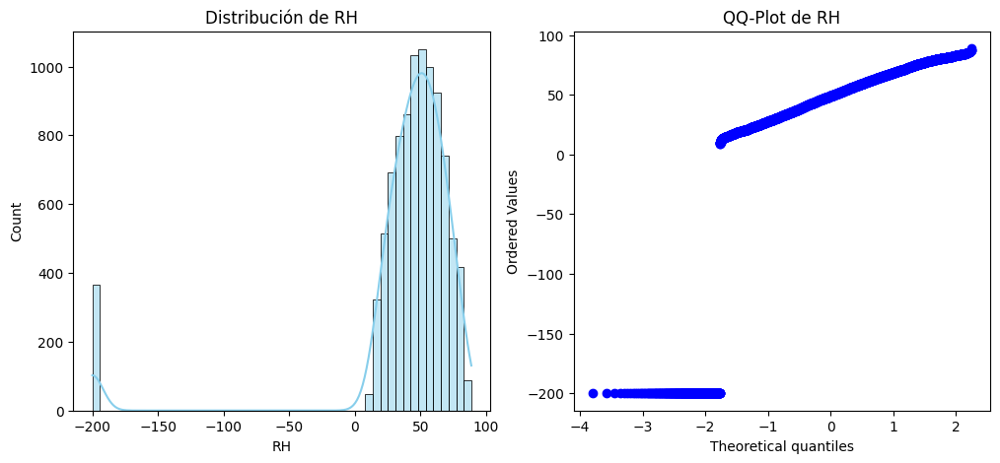


Pruebas de normalidad para la columna: RH
Shapiro-Wilk Test: p-valor = nan
Kolmogorov-Smirnov Test: p-valor = nan
Anderson-Darling Test: Estadístico = nan
  Al nivel de significancia 15.0%, los datos NO parecen normales.
  Al nivel de significancia 10.0%, los datos NO parecen normales.
  Al nivel de significancia 5.0%, los datos NO parecen normales.
  Al nivel de significancia 2.5%, los datos NO parecen normales.
  Al nivel de significancia 1.0%, los datos NO parecen normales.
D'Agostino-Pearson Test: p-valor = nan


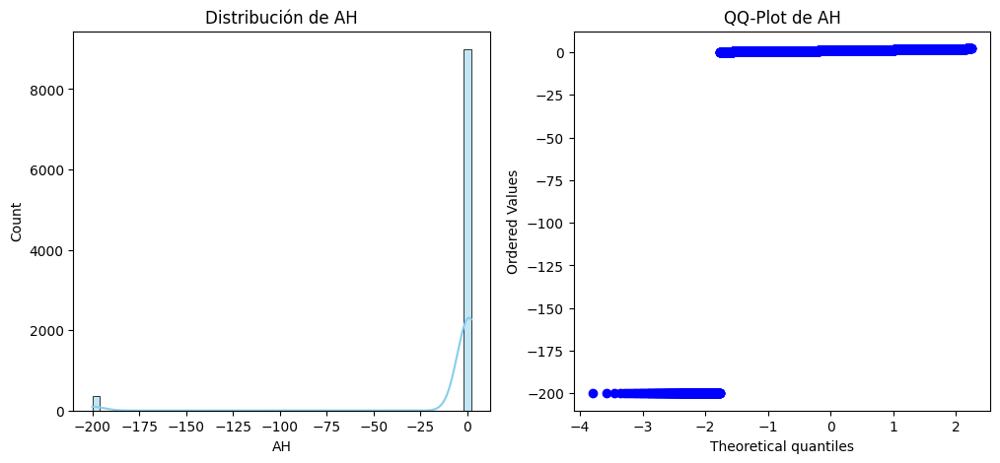


Pruebas de normalidad para la columna: AH
Shapiro-Wilk Test: p-valor = nan
Kolmogorov-Smirnov Test: p-valor = nan
Anderson-Darling Test: Estadístico = nan
  Al nivel de significancia 15.0%, los datos NO parecen normales.
  Al nivel de significancia 10.0%, los datos NO parecen normales.
  Al nivel de significancia 5.0%, los datos NO parecen normales.
  Al nivel de significancia 2.5%, los datos NO parecen normales.
  Al nivel de significancia 1.0%, los datos NO parecen normales.
D'Agostino-Pearson Test: p-valor = nan


In [62]:

# Función para realizar pruebas de normalidad
def normality_tests(data, column_name):
    print(f"\nPruebas de normalidad para la columna: {column_name}")

    # Prueba de Shapiro-Wilk
    shapiro_test = stats.shapiro(data.sample(min(5000, len(data)), random_state=42))  # Muestra de 5000 para evitar problemas de cómputo
    print(f"Shapiro-Wilk Test: p-valor = {shapiro_test.pvalue:.5f}")

    # Prueba de Kolmogorov-Smirnov
    ks_test = stats.kstest(data, 'norm', args=(data.mean(), data.std()))
    print(f"Kolmogorov-Smirnov Test: p-valor = {ks_test.pvalue:.5f}")

    # Prueba de Anderson-Darling
    anderson_test = stats.anderson(data, dist='norm')
    print(f"Anderson-Darling Test: Estadístico = {anderson_test.statistic:.5f}")
    for i in range(len(anderson_test.critical_values)):
        sl, cv = anderson_test.significance_level[i], anderson_test.critical_values[i]
        if anderson_test.statistic < cv:
            print(f"  Al nivel de significancia {sl}%, los datos parecen normales.")
        else:
            print(f"  Al nivel de significancia {sl}%, los datos NO parecen normales.")

    # Prueba de D'Agostino-Pearson
    dagostino_test = stats.normaltest(data)
    print(f"D'Agostino-Pearson Test: p-valor = {dagostino_test.pvalue:.5f}")

# Función para graficar histograma y QQ-Plot
def plot_distribution(data, column_name):
    plt.figure(figsize=(12, 5))

    # Histograma
    plt.subplot(1, 2, 1)
    sns.histplot(data, bins=50, kde=True, color="skyblue")
    plt.title(f"Distribución de {column_name}")

    # QQ-Plot
    plt.subplot(1, 2, 2)
    stats.probplot(data, dist="norm", plot=plt)
    plt.title(f"QQ-Plot de {column_name}")

    plt.show()

# Aplicar pruebas de normalidad y gráficos a cada columna numérica
for column in df_num:
    data = df_num[column]
    plot_distribution(data, column)
    normality_tests(data, column)


# Identificar y tratar los datos faltantes utilizando técnicas como imputación por media, mediana o moda, o eliminación de filas/columnas según sea apropiado.

In [45]:
df_num.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9471 entries, 0 to 9470
Data columns (total 13 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   CO(GT)         9357 non-null   float64
 1   PT08.S1(CO)    9357 non-null   float64
 2   NMHC(GT)       9357 non-null   float64
 3   C6H6(GT)       9357 non-null   float64
 4   PT08.S2(NMHC)  9357 non-null   float64
 5   NOx(GT)        9357 non-null   float64
 6   PT08.S3(NOx)   9357 non-null   float64
 7   NO2(GT)        9357 non-null   float64
 8   PT08.S4(NO2)   9357 non-null   float64
 9   PT08.S5(O3)    9357 non-null   float64
 10  T              9357 non-null   float64
 11  RH             9357 non-null   float64
 12  AH             9357 non-null   float64
dtypes: float64(13)
memory usage: 962.0 KB


In [46]:
data = df_num.dropna()
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 9357 entries, 0 to 9356
Data columns (total 13 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   CO(GT)         9357 non-null   float64
 1   PT08.S1(CO)    9357 non-null   float64
 2   NMHC(GT)       9357 non-null   float64
 3   C6H6(GT)       9357 non-null   float64
 4   PT08.S2(NMHC)  9357 non-null   float64
 5   NOx(GT)        9357 non-null   float64
 6   PT08.S3(NOx)   9357 non-null   float64
 7   NO2(GT)        9357 non-null   float64
 8   PT08.S4(NO2)   9357 non-null   float64
 9   PT08.S5(O3)    9357 non-null   float64
 10  T              9357 non-null   float64
 11  RH             9357 non-null   float64
 12  AH             9357 non-null   float64
dtypes: float64(13)
memory usage: 1023.4 KB


In [47]:

print(data.head())

   CO(GT)  PT08.S1(CO)  NMHC(GT)  C6H6(GT)  PT08.S2(NMHC)  NOx(GT)  \
0     2.6       1360.0     150.0      11.9         1046.0    166.0   
1     2.0       1292.0     112.0       9.4          955.0    103.0   
2     2.2       1402.0      88.0       9.0          939.0    131.0   
3     2.2       1376.0      80.0       9.2          948.0    172.0   
4     1.6       1272.0      51.0       6.5          836.0    131.0   

   PT08.S3(NOx)  NO2(GT)  PT08.S4(NO2)  PT08.S5(O3)     T    RH      AH  
0        1056.0    113.0        1692.0       1268.0  13.6  48.9  0.7578  
1        1174.0     92.0        1559.0        972.0  13.3  47.7  0.7255  
2        1140.0    114.0        1555.0       1074.0  11.9  54.0  0.7502  
3        1092.0    122.0        1584.0       1203.0  11.0  60.0  0.7867  
4        1205.0    116.0        1490.0       1110.0  11.2  59.6  0.7888  


In [52]:

data2 = data.where(data > 0, np.nan)

print(data2.head())

   CO(GT)  PT08.S1(CO)  NMHC(GT)  C6H6(GT)  PT08.S2(NMHC)  NOx(GT)  \
0     2.6       1360.0     150.0      11.9         1046.0    166.0   
1     2.0       1292.0     112.0       9.4          955.0    103.0   
2     2.2       1402.0      88.0       9.0          939.0    131.0   
3     2.2       1376.0      80.0       9.2          948.0    172.0   
4     1.6       1272.0      51.0       6.5          836.0    131.0   

   PT08.S3(NOx)  NO2(GT)  PT08.S4(NO2)  PT08.S5(O3)     T    RH      AH  
0        1056.0    113.0        1692.0       1268.0  13.6  48.9  0.7578  
1        1174.0     92.0        1559.0        972.0  13.3  47.7  0.7255  
2        1140.0    114.0        1555.0       1074.0  11.9  54.0  0.7502  
3        1092.0    122.0        1584.0       1203.0  11.0  60.0  0.7867  
4        1205.0    116.0        1490.0       1110.0  11.2  59.6  0.7888  


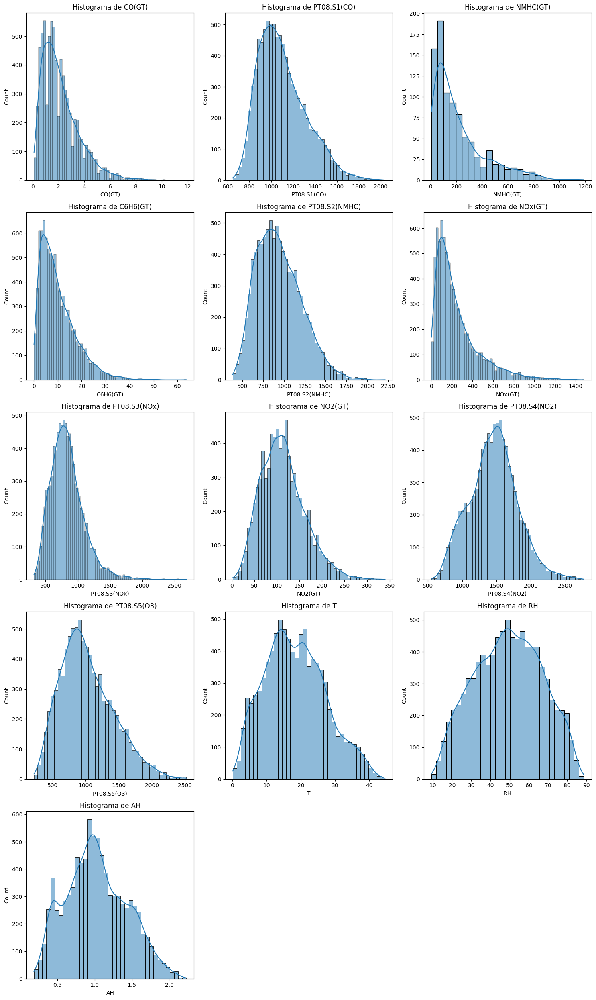

In [53]:
ncols = 3
nrows = math.ceil(len(data2.columns) / ncols)

fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(15, 5 * nrows))
axes = axes.flatten()

for i, column in enumerate(data2.columns):
    sns.histplot(data2[column], kde=True, ax=axes[i])
    axes[i].set_title(f'Histograma de {column}')


for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

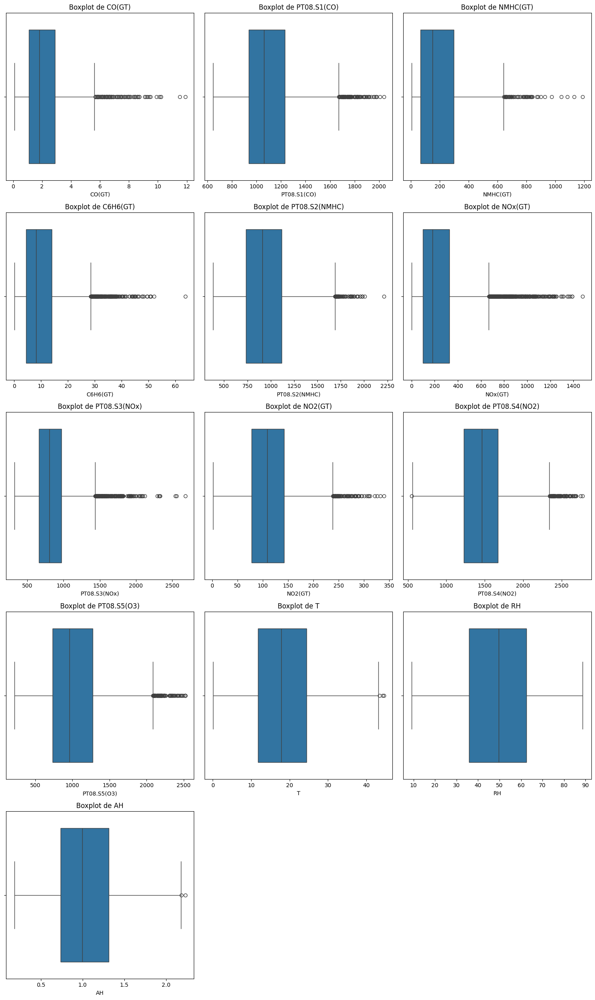

In [54]:
ncols = 3
nrows = math.ceil(len(data2.columns) / ncols)

fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(15, 5 * nrows))
axes = axes.flatten()

for i, column in enumerate(data2.columns):
    sns.boxplot(x=data2[column], ax=axes[i])
    axes[i].set_title(f'Boxplot de {column}')


for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()

Matriz de correlación:
                 CO(GT)  PT08.S1(CO)  NMHC(GT)  C6H6(GT)  PT08.S2(NMHC)  \
CO(GT)         1.000000     0.879288  0.889734  0.931078       0.915514   
PT08.S1(CO)    0.879288     1.000000  0.790670  0.883795       0.892964   
NMHC(GT)       0.889734     0.790670  1.000000  0.902559       0.877696   
C6H6(GT)       0.931078     0.883795  0.902559  1.000000       0.981950   
PT08.S2(NMHC)  0.915514     0.892964  0.877696  0.981950       1.000000   
NOx(GT)        0.795028     0.713654  0.812685  0.718839       0.704435   
PT08.S3(NOx)  -0.703446    -0.771938 -0.771135 -0.735744      -0.796703   
NO2(GT)        0.683343     0.641529  0.731193  0.614474       0.646245   
PT08.S4(NO2)   0.630703     0.682881  0.853267  0.765731       0.777254   
PT08.S5(O3)    0.854182     0.899324  0.766723  0.865689       0.880578   
T              0.018971     0.044772  0.391587  0.196621       0.238308   
RH             0.048890     0.114606 -0.191454 -0.061681      -0.090380   
AH

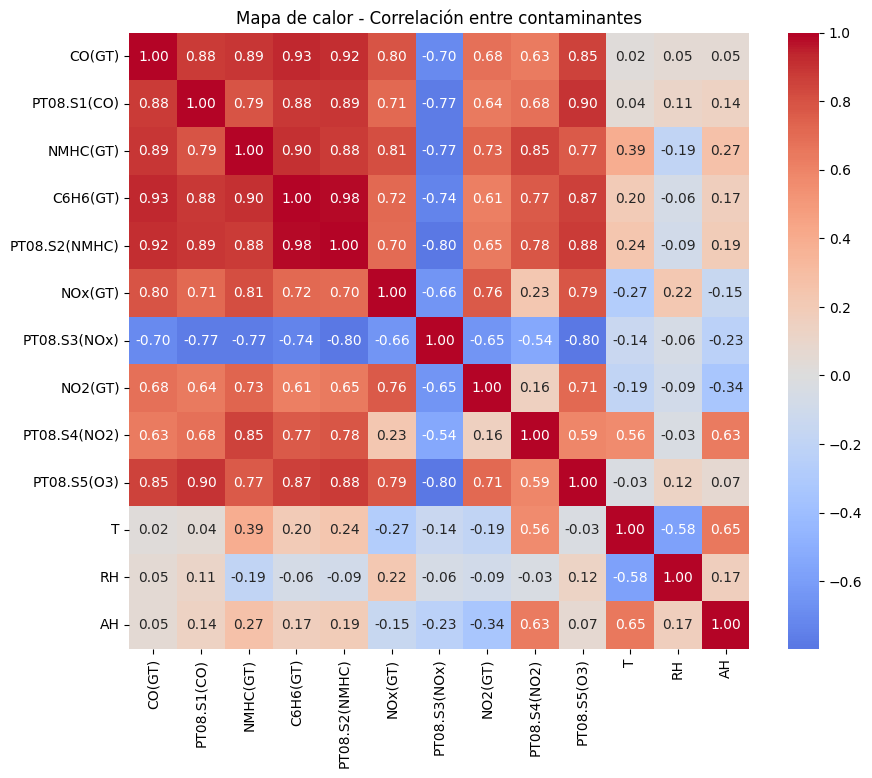

In [55]:
corr = data2.corr(method='pearson')
print("Matriz de correlación:")
print(corr)

plt.figure(figsize=(10,8))
sns.heatmap(corr, annot=True, cmap="coolwarm", center=0, fmt=".2f")
plt.title("Mapa de calor - Correlación entre contaminantes")
plt.show()

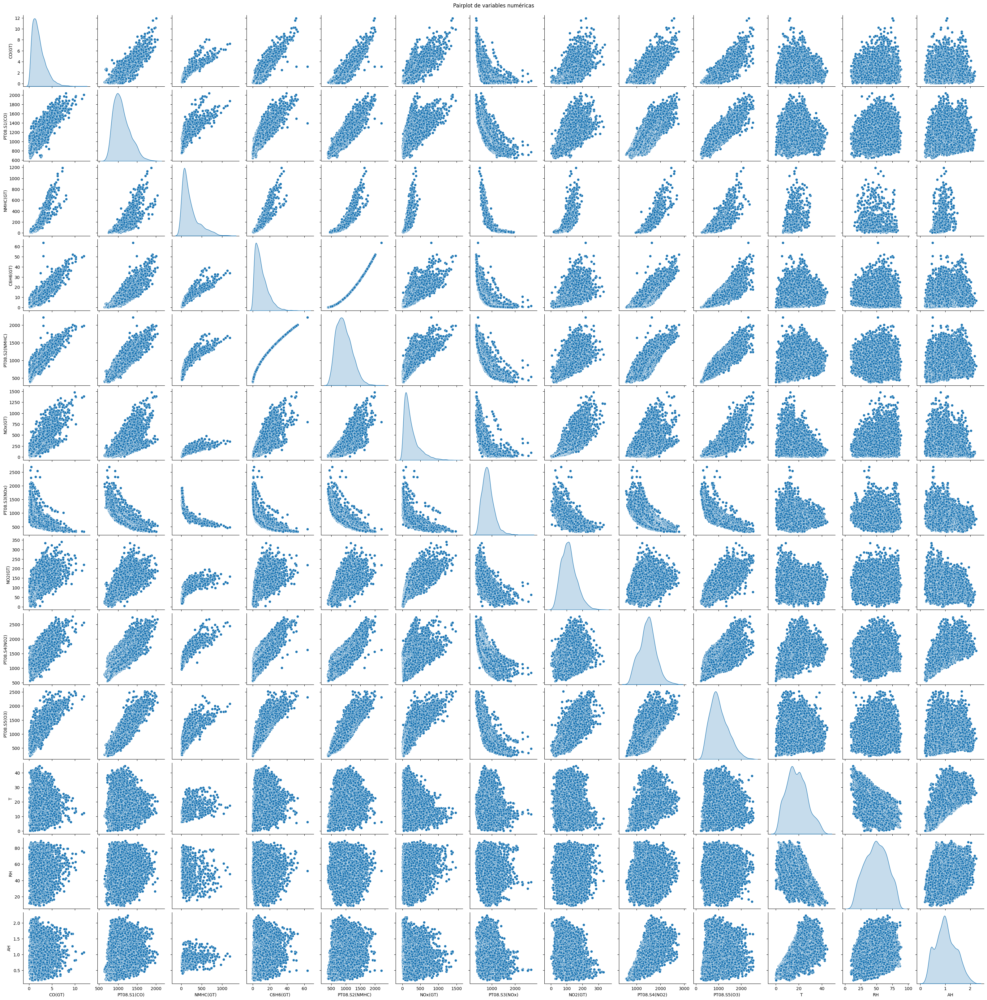

In [56]:
sns.pairplot(data2, diag_kind="kde")
plt.suptitle("Pairplot de variables numéricas", y=1)
plt.show()

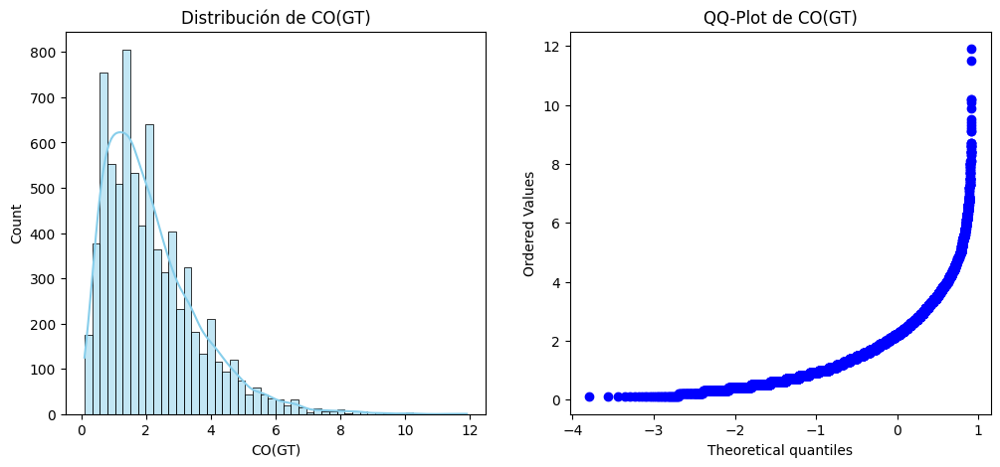


Pruebas de normalidad para la columna: CO(GT)
Shapiro-Wilk Test: p-valor = nan
Kolmogorov-Smirnov Test: p-valor = nan
Anderson-Darling Test: Estadístico = nan
  Al nivel de significancia 15.0%, los datos NO parecen normales.
  Al nivel de significancia 10.0%, los datos NO parecen normales.
  Al nivel de significancia 5.0%, los datos NO parecen normales.
  Al nivel de significancia 2.5%, los datos NO parecen normales.
  Al nivel de significancia 1.0%, los datos NO parecen normales.
D'Agostino-Pearson Test: p-valor = nan


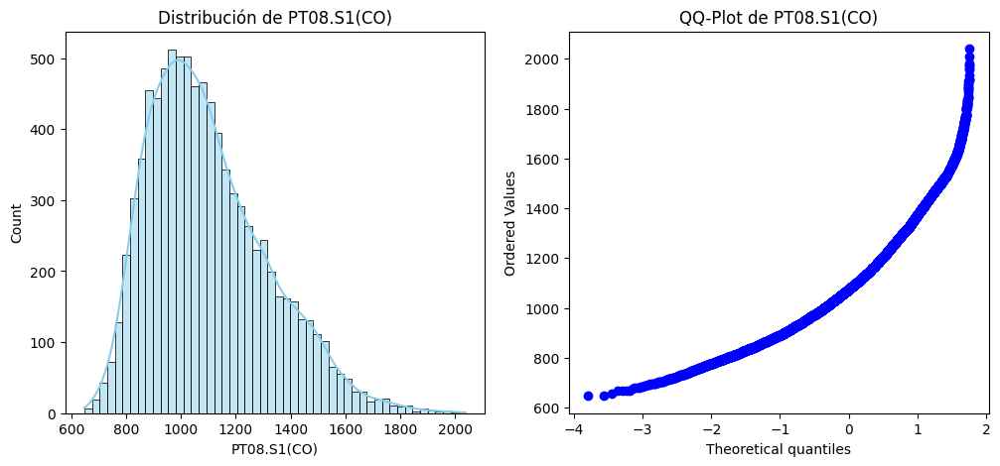


Pruebas de normalidad para la columna: PT08.S1(CO)
Shapiro-Wilk Test: p-valor = nan
Kolmogorov-Smirnov Test: p-valor = nan
Anderson-Darling Test: Estadístico = nan
  Al nivel de significancia 15.0%, los datos NO parecen normales.
  Al nivel de significancia 10.0%, los datos NO parecen normales.
  Al nivel de significancia 5.0%, los datos NO parecen normales.
  Al nivel de significancia 2.5%, los datos NO parecen normales.
  Al nivel de significancia 1.0%, los datos NO parecen normales.
D'Agostino-Pearson Test: p-valor = nan


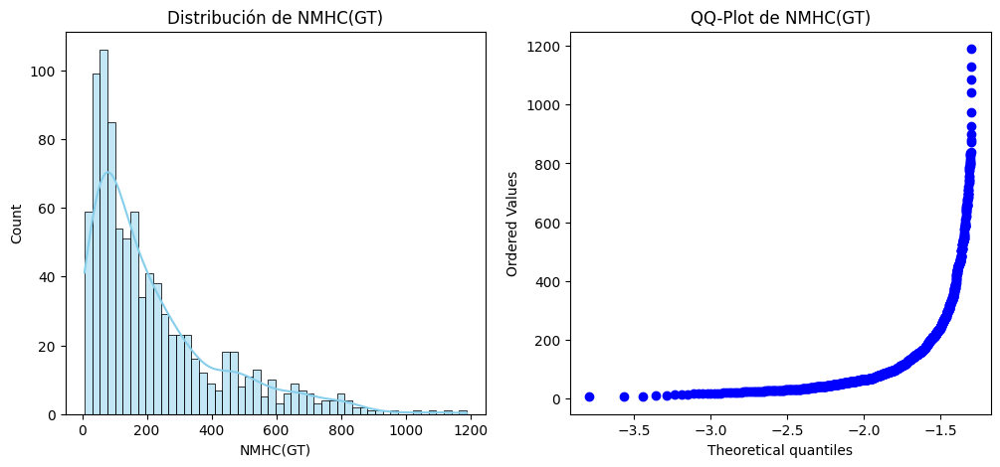


Pruebas de normalidad para la columna: NMHC(GT)
Shapiro-Wilk Test: p-valor = nan
Kolmogorov-Smirnov Test: p-valor = nan
Anderson-Darling Test: Estadístico = nan
  Al nivel de significancia 15.0%, los datos NO parecen normales.
  Al nivel de significancia 10.0%, los datos NO parecen normales.
  Al nivel de significancia 5.0%, los datos NO parecen normales.
  Al nivel de significancia 2.5%, los datos NO parecen normales.
  Al nivel de significancia 1.0%, los datos NO parecen normales.
D'Agostino-Pearson Test: p-valor = nan


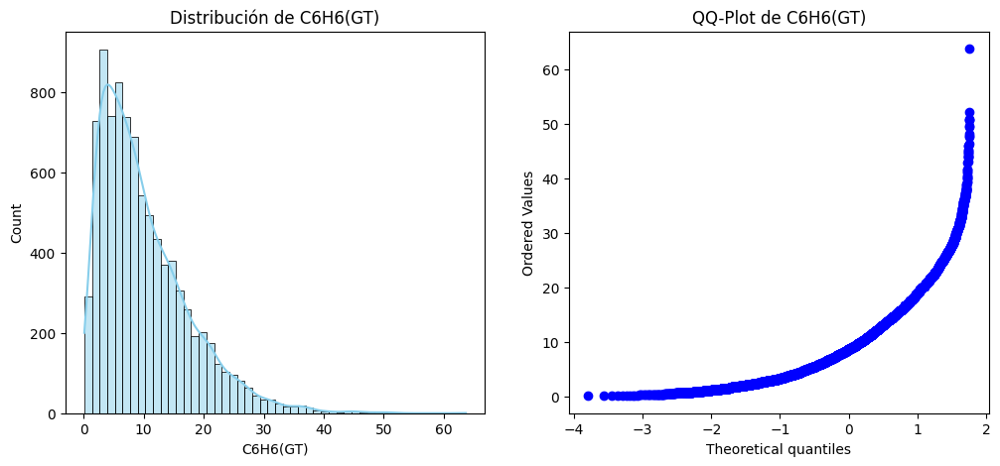


Pruebas de normalidad para la columna: C6H6(GT)
Shapiro-Wilk Test: p-valor = nan
Kolmogorov-Smirnov Test: p-valor = nan
Anderson-Darling Test: Estadístico = nan
  Al nivel de significancia 15.0%, los datos NO parecen normales.
  Al nivel de significancia 10.0%, los datos NO parecen normales.
  Al nivel de significancia 5.0%, los datos NO parecen normales.
  Al nivel de significancia 2.5%, los datos NO parecen normales.
  Al nivel de significancia 1.0%, los datos NO parecen normales.
D'Agostino-Pearson Test: p-valor = nan


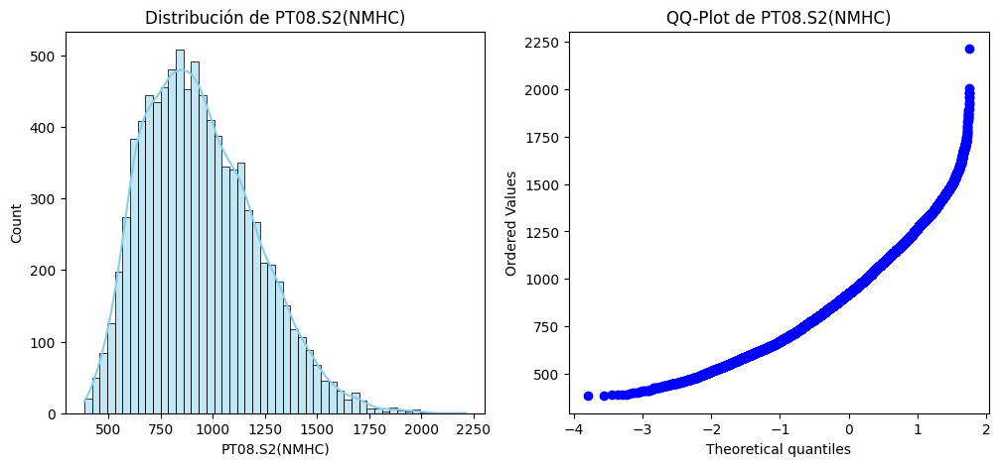


Pruebas de normalidad para la columna: PT08.S2(NMHC)
Shapiro-Wilk Test: p-valor = nan
Kolmogorov-Smirnov Test: p-valor = nan
Anderson-Darling Test: Estadístico = nan
  Al nivel de significancia 15.0%, los datos NO parecen normales.
  Al nivel de significancia 10.0%, los datos NO parecen normales.
  Al nivel de significancia 5.0%, los datos NO parecen normales.
  Al nivel de significancia 2.5%, los datos NO parecen normales.
  Al nivel de significancia 1.0%, los datos NO parecen normales.
D'Agostino-Pearson Test: p-valor = nan


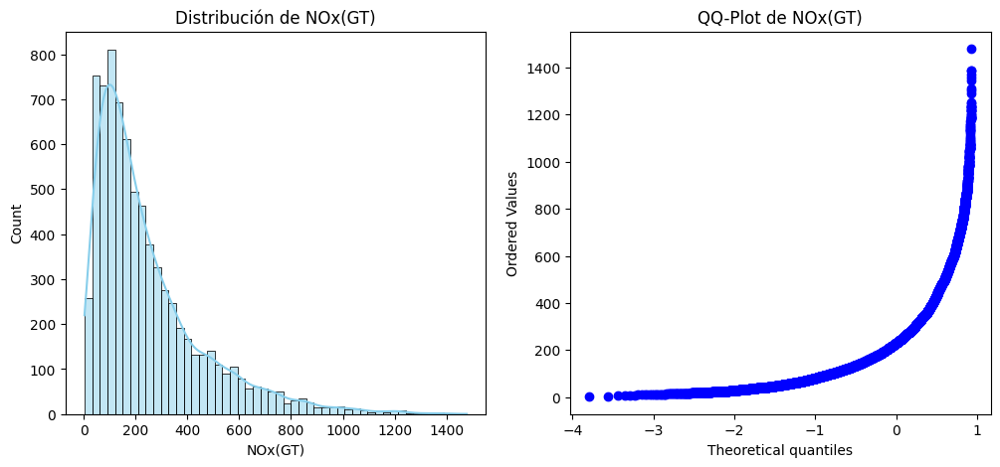


Pruebas de normalidad para la columna: NOx(GT)
Shapiro-Wilk Test: p-valor = nan
Kolmogorov-Smirnov Test: p-valor = nan
Anderson-Darling Test: Estadístico = nan
  Al nivel de significancia 15.0%, los datos NO parecen normales.
  Al nivel de significancia 10.0%, los datos NO parecen normales.
  Al nivel de significancia 5.0%, los datos NO parecen normales.
  Al nivel de significancia 2.5%, los datos NO parecen normales.
  Al nivel de significancia 1.0%, los datos NO parecen normales.
D'Agostino-Pearson Test: p-valor = nan


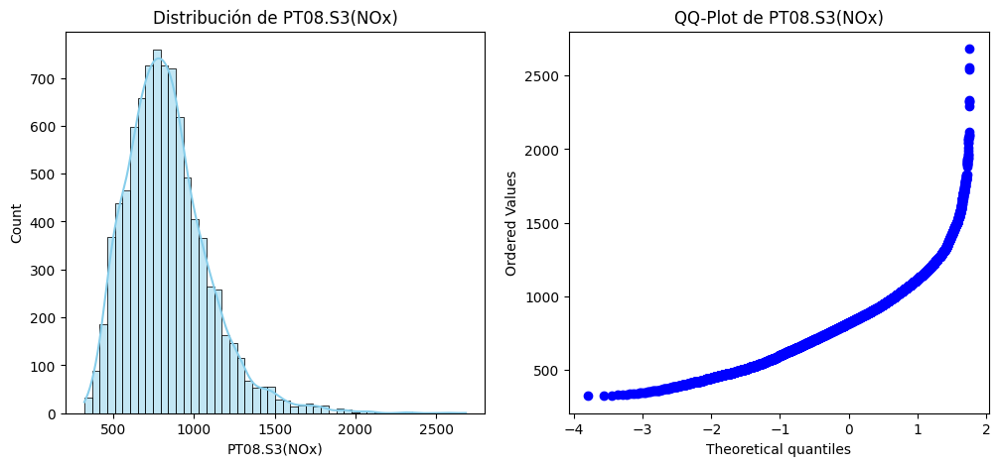


Pruebas de normalidad para la columna: PT08.S3(NOx)
Shapiro-Wilk Test: p-valor = nan
Kolmogorov-Smirnov Test: p-valor = nan
Anderson-Darling Test: Estadístico = nan
  Al nivel de significancia 15.0%, los datos NO parecen normales.
  Al nivel de significancia 10.0%, los datos NO parecen normales.
  Al nivel de significancia 5.0%, los datos NO parecen normales.
  Al nivel de significancia 2.5%, los datos NO parecen normales.
  Al nivel de significancia 1.0%, los datos NO parecen normales.
D'Agostino-Pearson Test: p-valor = nan


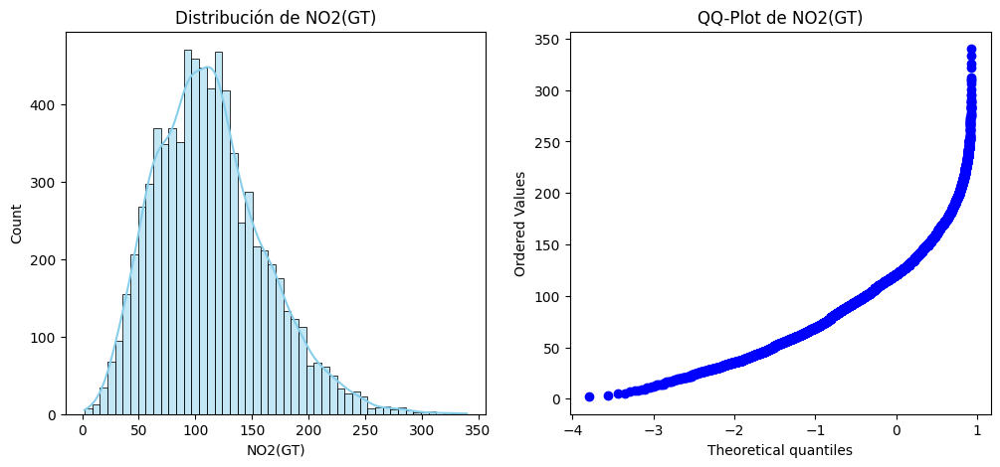


Pruebas de normalidad para la columna: NO2(GT)
Shapiro-Wilk Test: p-valor = nan
Kolmogorov-Smirnov Test: p-valor = nan
Anderson-Darling Test: Estadístico = nan
  Al nivel de significancia 15.0%, los datos NO parecen normales.
  Al nivel de significancia 10.0%, los datos NO parecen normales.
  Al nivel de significancia 5.0%, los datos NO parecen normales.
  Al nivel de significancia 2.5%, los datos NO parecen normales.
  Al nivel de significancia 1.0%, los datos NO parecen normales.
D'Agostino-Pearson Test: p-valor = nan


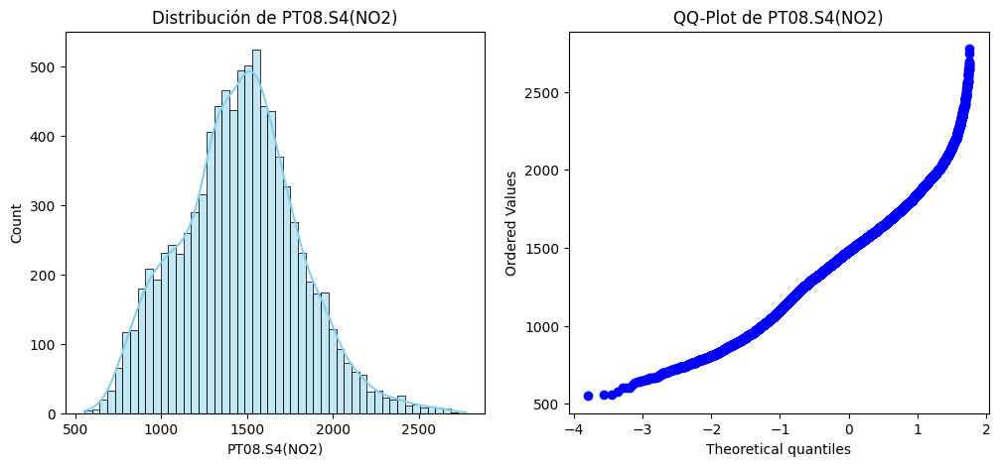


Pruebas de normalidad para la columna: PT08.S4(NO2)
Shapiro-Wilk Test: p-valor = nan
Kolmogorov-Smirnov Test: p-valor = nan
Anderson-Darling Test: Estadístico = nan
  Al nivel de significancia 15.0%, los datos NO parecen normales.
  Al nivel de significancia 10.0%, los datos NO parecen normales.
  Al nivel de significancia 5.0%, los datos NO parecen normales.
  Al nivel de significancia 2.5%, los datos NO parecen normales.
  Al nivel de significancia 1.0%, los datos NO parecen normales.
D'Agostino-Pearson Test: p-valor = nan


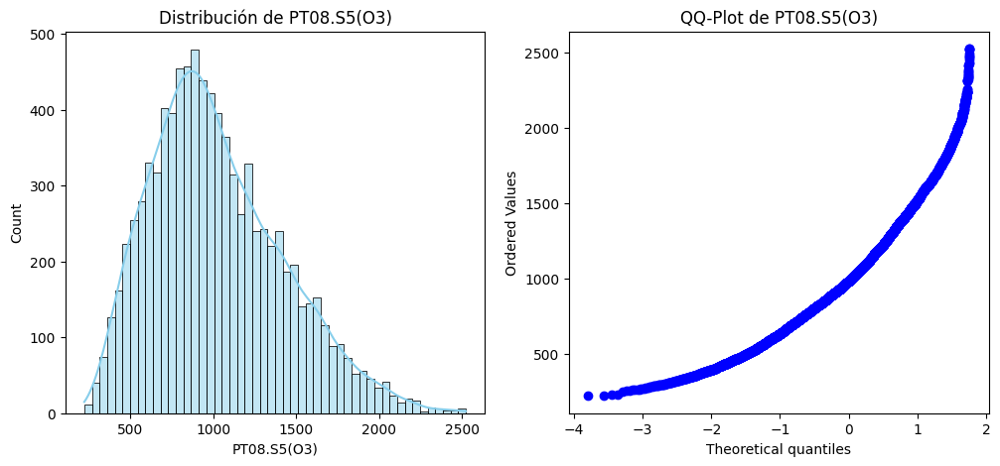


Pruebas de normalidad para la columna: PT08.S5(O3)
Shapiro-Wilk Test: p-valor = nan
Kolmogorov-Smirnov Test: p-valor = nan
Anderson-Darling Test: Estadístico = nan
  Al nivel de significancia 15.0%, los datos NO parecen normales.
  Al nivel de significancia 10.0%, los datos NO parecen normales.
  Al nivel de significancia 5.0%, los datos NO parecen normales.
  Al nivel de significancia 2.5%, los datos NO parecen normales.
  Al nivel de significancia 1.0%, los datos NO parecen normales.
D'Agostino-Pearson Test: p-valor = nan


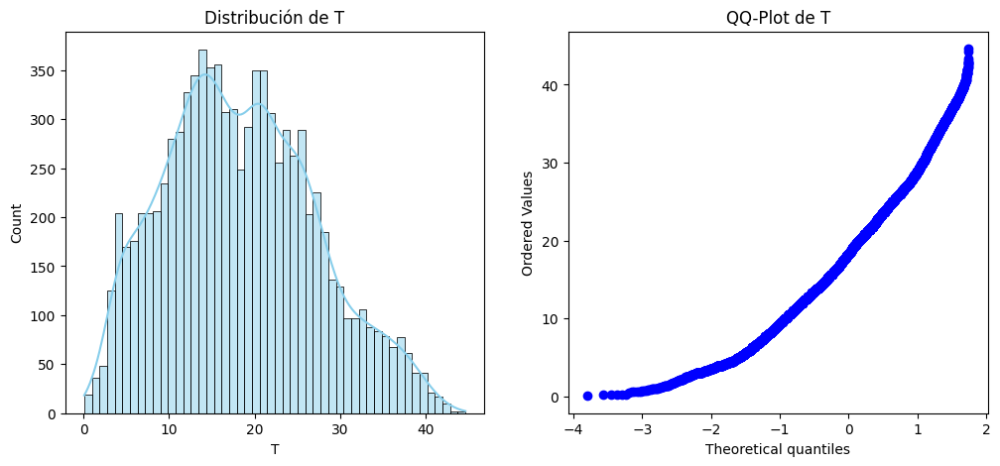


Pruebas de normalidad para la columna: T
Shapiro-Wilk Test: p-valor = nan
Kolmogorov-Smirnov Test: p-valor = nan
Anderson-Darling Test: Estadístico = nan
  Al nivel de significancia 15.0%, los datos NO parecen normales.
  Al nivel de significancia 10.0%, los datos NO parecen normales.
  Al nivel de significancia 5.0%, los datos NO parecen normales.
  Al nivel de significancia 2.5%, los datos NO parecen normales.
  Al nivel de significancia 1.0%, los datos NO parecen normales.
D'Agostino-Pearson Test: p-valor = nan


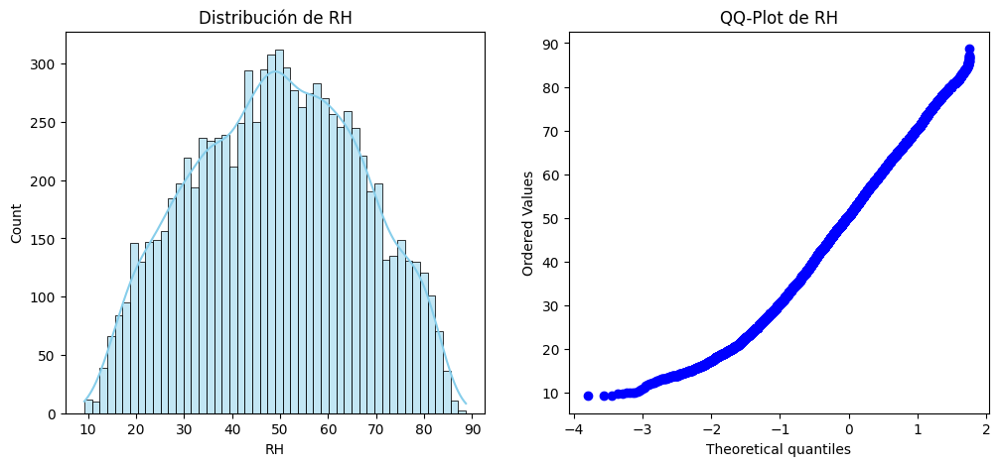


Pruebas de normalidad para la columna: RH
Shapiro-Wilk Test: p-valor = nan
Kolmogorov-Smirnov Test: p-valor = nan
Anderson-Darling Test: Estadístico = nan
  Al nivel de significancia 15.0%, los datos NO parecen normales.
  Al nivel de significancia 10.0%, los datos NO parecen normales.
  Al nivel de significancia 5.0%, los datos NO parecen normales.
  Al nivel de significancia 2.5%, los datos NO parecen normales.
  Al nivel de significancia 1.0%, los datos NO parecen normales.
D'Agostino-Pearson Test: p-valor = nan


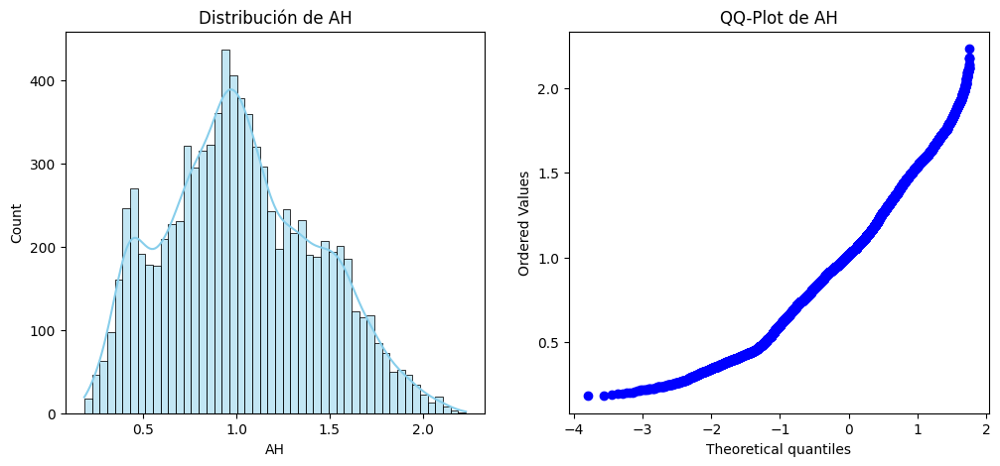


Pruebas de normalidad para la columna: AH
Shapiro-Wilk Test: p-valor = nan
Kolmogorov-Smirnov Test: p-valor = nan
Anderson-Darling Test: Estadístico = nan
  Al nivel de significancia 15.0%, los datos NO parecen normales.
  Al nivel de significancia 10.0%, los datos NO parecen normales.
  Al nivel de significancia 5.0%, los datos NO parecen normales.
  Al nivel de significancia 2.5%, los datos NO parecen normales.
  Al nivel de significancia 1.0%, los datos NO parecen normales.
D'Agostino-Pearson Test: p-valor = nan


In [61]:

# Función para realizar pruebas de normalidad
def normality_tests(data, column_name):
    print(f"\nPruebas de normalidad para la columna: {column_name}")

    # Prueba de Shapiro-Wilk
    shapiro_test = stats.shapiro(data.sample(min(5000, len(data)), random_state=42))  # Muestra de 5000 para evitar problemas de cómputo
    print(f"Shapiro-Wilk Test: p-valor = {shapiro_test.pvalue:.5f}")

    # Prueba de Kolmogorov-Smirnov
    ks_test = stats.kstest(data, 'norm', args=(data.mean(), data.std()))
    print(f"Kolmogorov-Smirnov Test: p-valor = {ks_test.pvalue:.5f}")

    # Prueba de Anderson-Darling
    anderson_test = stats.anderson(data, dist='norm')
    print(f"Anderson-Darling Test: Estadístico = {anderson_test.statistic:.5f}")
    for i in range(len(anderson_test.critical_values)):
        sl, cv = anderson_test.significance_level[i], anderson_test.critical_values[i]
        if anderson_test.statistic < cv:
            print(f"  Al nivel de significancia {sl}%, los datos parecen normales.")
        else:
            print(f"  Al nivel de significancia {sl}%, los datos NO parecen normales.")

    # Prueba de D'Agostino-Pearson
    dagostino_test = stats.normaltest(data)
    print(f"D'Agostino-Pearson Test: p-valor = {dagostino_test.pvalue:.5f}")

# Función para graficar histograma y QQ-Plot
def plot_distribution(data, column_name):
    plt.figure(figsize=(12, 5))

    # Histograma
    plt.subplot(1, 2, 1)
    sns.histplot(data, bins=50, kde=True, color="skyblue")
    plt.title(f"Distribución de {column_name}")

    # QQ-Plot
    plt.subplot(1, 2, 2)
    stats.probplot(data, dist="norm", plot=plt)
    plt.title(f"QQ-Plot de {column_name}")

    plt.show()

# Aplicar pruebas de normalidad y gráficos a cada columna numérica
for column in data2:
    data = data2[column]
    plot_distribution(data, column)
    normality_tests(data, column)